# Processing of binned data
The objective of this notebook is to create rolling images of data where it is reasonable to perform an interpolation.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pickle import load
from mpl_toolkits.basemap import Basemap
from itertools import chain
import warnings

In [4]:
# Lord forgive me for this:
np.seterr(all="ignore")

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

We can start simply with the values from the 2013 to 2014 season from AltiKa and CryoSat-2.

In [5]:
ak_values = np.load("../data/CPOM/freeboard_daily_processed/AK_CPOM/dailyFB_50km_2013-2014_season.pkl", allow_pickle=True)
cs2_values = np.load("../data/CPOM/freeboard_daily_processed/CS2_CPOM/dailyFB_50km_2013-2014_season.pkl", allow_pickle=True)

In [90]:
list(ak_values.values())[0].shape

(160, 160)

In [16]:
ak_values['20131010'].shape

(160, 160)

In [20]:
lat_g = np.load("../data/CPOM/freeboard_daily_processed/will_lats.npy")[:-1, :-1]
lon_g = np.load("../data/CPOM/freeboard_daily_processed/will_lons.npy")[:-1, :-1]

## Rolling pictures

In [ ]:
sliding_window = 10
shape = (sliding_window, 160, 160)

In [ ]:
ak_map = np.empty(shape)
cs2_map = np.empty(shape)

for i, date in enumerate(list(ak_values.keys())[:sliding_window]):
    ak_map[i] += ak_values[date]
    cs2_map[i] += cs2_values[date]

In [ ]:
cs2_mean = np.nanmean(cs2_map, axis=0)
plt.imshow(cs2_mean)

In [ ]:
ak_mean = np.nanmean(ak_map, axis=0)
plt.imshow(ak_mean)

In [9]:
def draw_map(m, scale=0.2):
    # draw a shaded-relief image
    m.shadedrelief(scale=scale)
    
    # lats and longs are returned as a dictionary
    lats = m.drawparallels(np.linspace(-90, 90, 13))
    lons = m.drawmeridians(np.linspace(-180, 180, 13))

    # keys contain the plt.Line2D instances
    lat_lines = chain(*(tup[1][0] for tup in lats.items()))
    lon_lines = chain(*(tup[1][0] for tup in lons.items()))
    all_lines = chain(lat_lines, lon_lines)
    
    # cycle through these lines and set the desired style
    for line in all_lines:
        line.set(linestyle='-', alpha=0.3, color='w')

In [2]:
# 1. Draw map background:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 40))

# Draw map
m = Basemap(projection='lcc', resolution=None, lat_0=-90, lon_0=0, lat_1=89.9, lon_1=180, width=1E7, height=0.5E7, ax=ax1)
draw_map(m)

# 2. Scatter observation data
m.scatter(lon_g, lat_g, latlon=True, alpha=1, s=0.5, c=cs2_mean, cmap="seismic", ax=ax1)
ax1.set_title("CS2")

# Draw map
m = Basemap(projection='lcc', resolution=None, lat_0=-90, lon_0=0, lat_1=89.9, lon_1=180, width=1E7, height=0.5E7, ax=ax2)
draw_map(m)

# 2. Scatter observation data
m.scatter(lon_g, lat_g, latlon=True, alpha=1, s=0.5, c=ak_mean, cmap="seismic", ax=ax2)
ax2.set_title("AK")

print(f"Mean value with a rolling window = {sliding_window}")

NameError: name 'plt' is not defined

In [ ]:
possibilites = [3, 5, 10, 15, 20, 25, 30, 35, 40]

for sliding_window in possibilites:
    shape = (sliding_window, 160, 160)
    ak_map = np.empty(shape)
    cs2_map = np.empty(shape)

    for i, date in enumerate(list(ak_values.keys())[:sliding_window]):
        ak_map[i] += ak_values[date]
        cs2_map[i] += cs2_values[date]


    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=RuntimeWarning)
        cs2_mean = np.nanmean(cs2_map, axis=0)
        ak_mean = np.nanmean(ak_map, axis=0)


    # 1. Draw map background:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 40))

    # Draw map
    m = Basemap(projection='lcc', resolution=None, lat_0=-90, lon_0=0, lat_1=89.9, lon_1=180, width=1E7, height=0.5E7, ax=ax1)
    draw_map(m)

    # 2. Scatter observation data
    m.scatter(lon_g, lat_g, latlon=True, alpha=1, s=0.5, c=cs2_mean, cmap="seismic", ax=ax1)
    ax1.set_title("CS2")

    # Draw map
    m = Basemap(projection='lcc', resolution=None, lat_0=-90, lon_0=0, lat_1=89.9, lon_1=180, width=1E7, height=0.5E7, ax=ax2)
    draw_map(m)

    # 2. Scatter observation data
    m.scatter(lon_g, lat_g, latlon=True, alpha=1, s=0.5, c=ak_mean, cmap="seismic", ax=ax2)
    ax2.set_title("AK")

    print(f"Sliding window of {sliding_window} days: ")
    plt.show()

From 20131001 to 20131008:


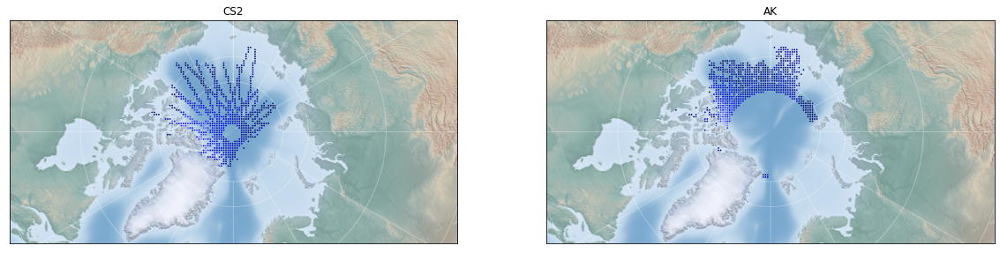

From 20131008 to 20131015:


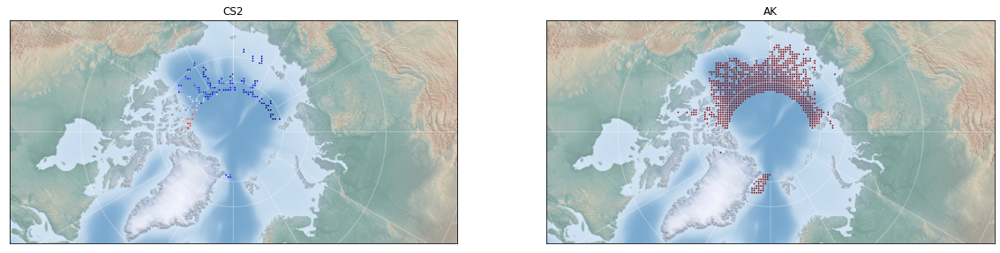

From 20131015 to 20131022:


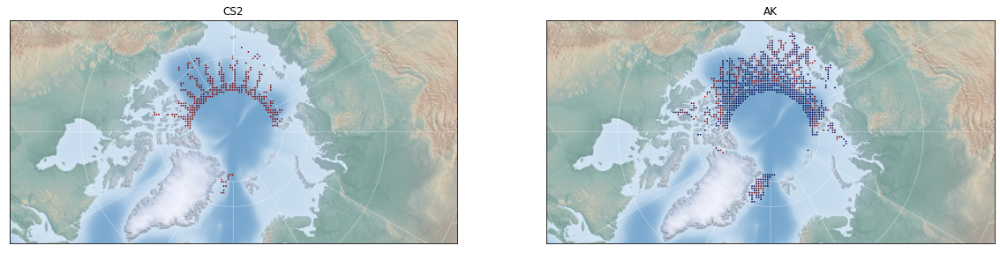

From 20131022 to 20131029:


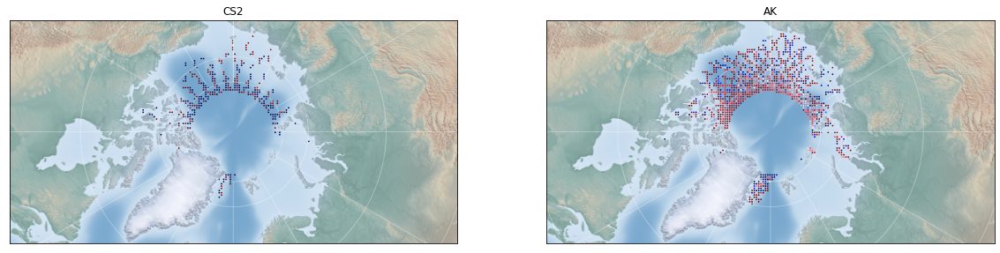

From 20131029 to 20131105:


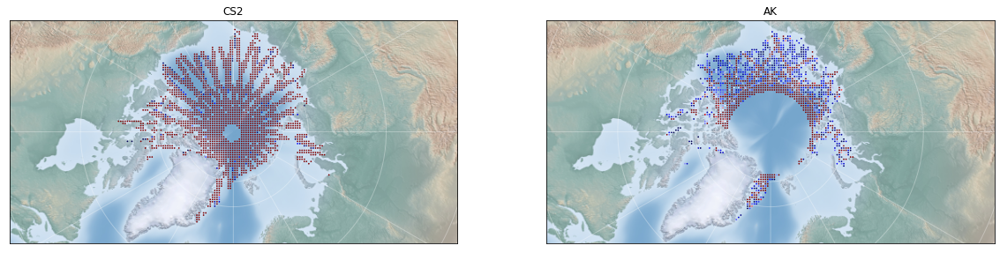

From 20131105 to 20131112:


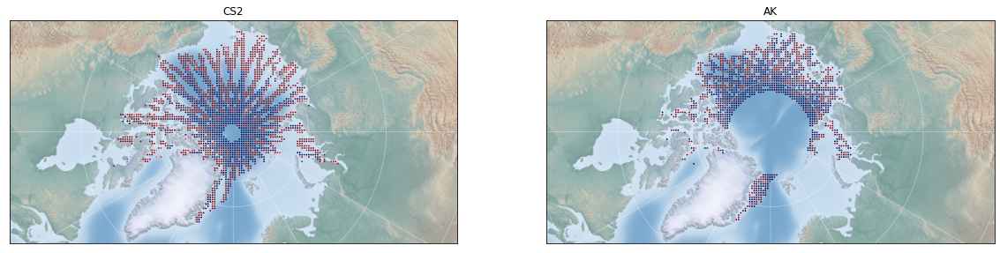

From 20131112 to 20131119:


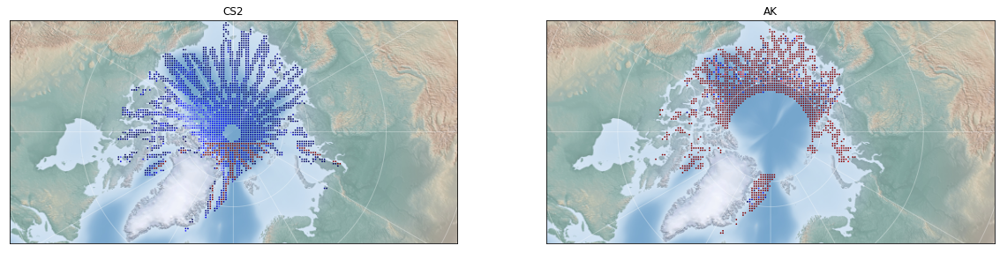

From 20131119 to 20131126:


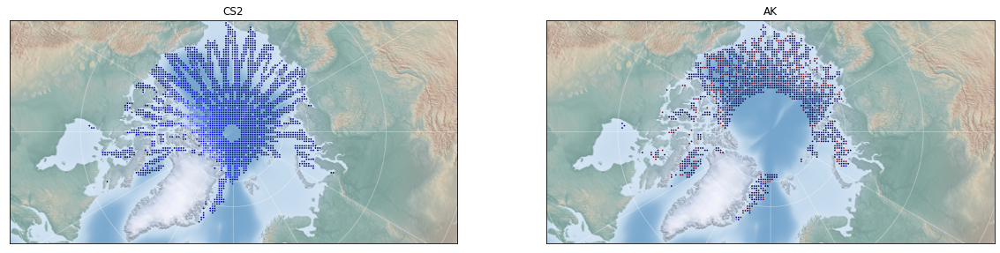

From 20131126 to 20131203:


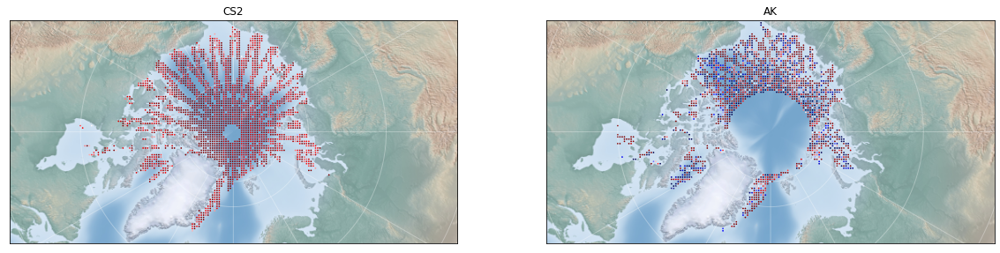

From 20131203 to 20131210:


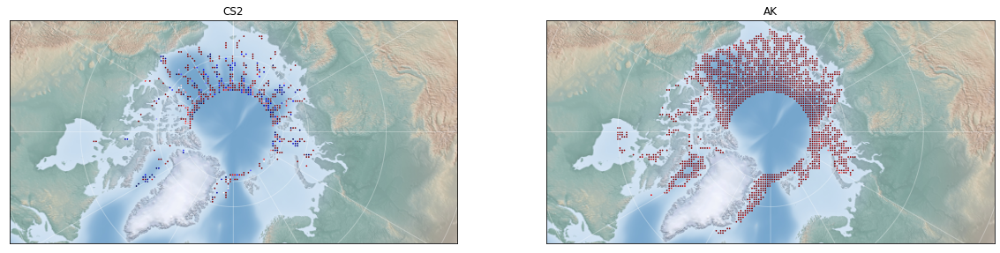

From 20131210 to 20131217:


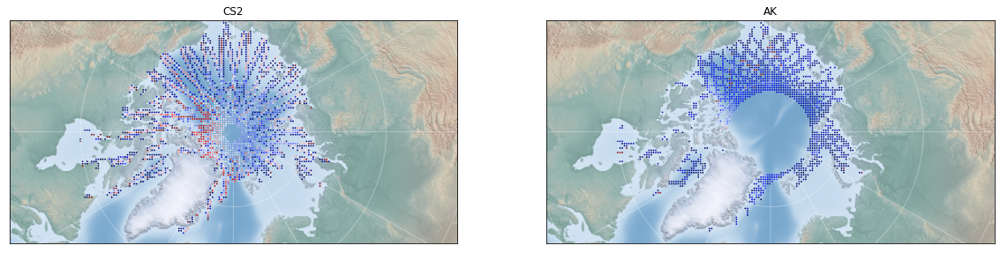

From 20131217 to 20131224:


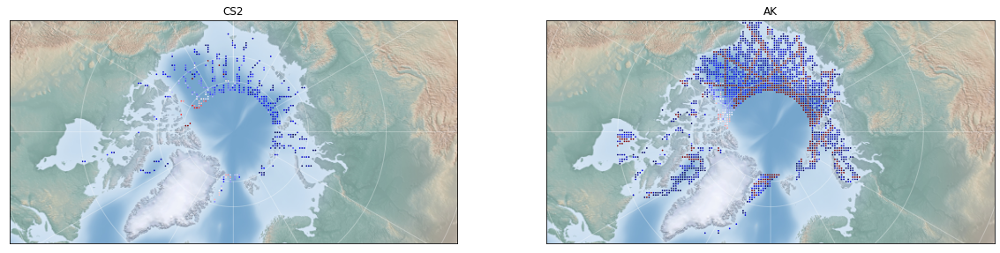

From 20131224 to 20131231:


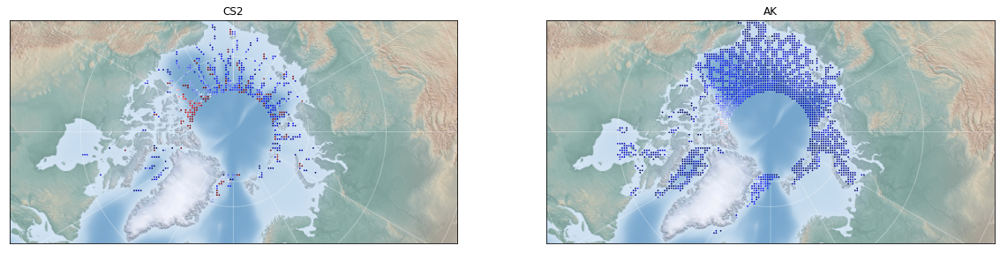

From 20131231 to 20140107:


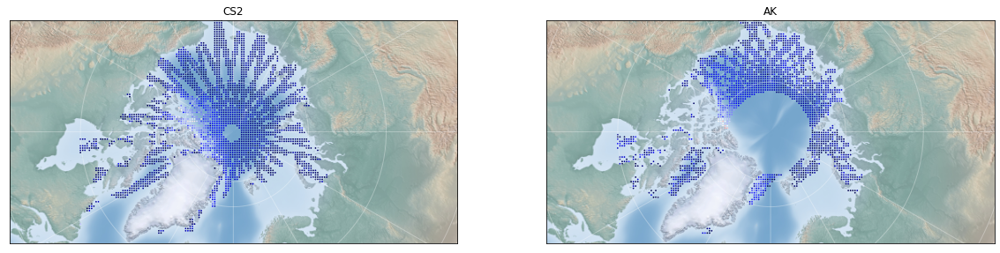

From 20140107 to 20140114:


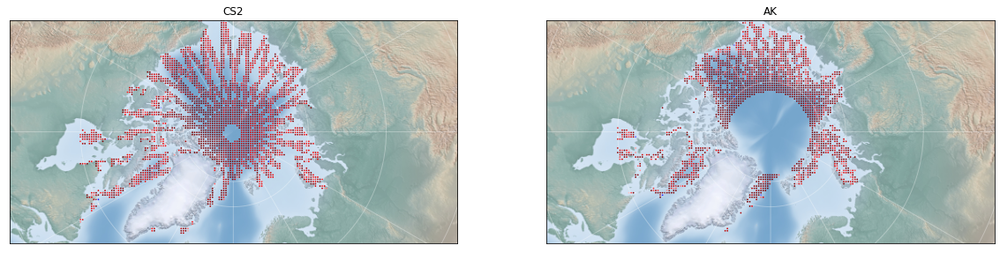

From 20140114 to 20140121:


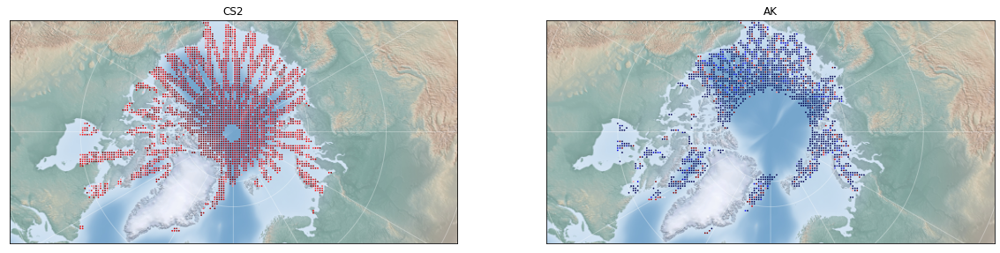

From 20140121 to 20140128:


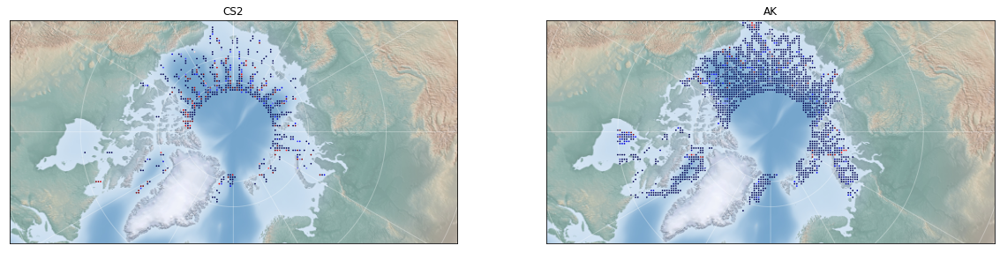

From 20140128 to 20140204:


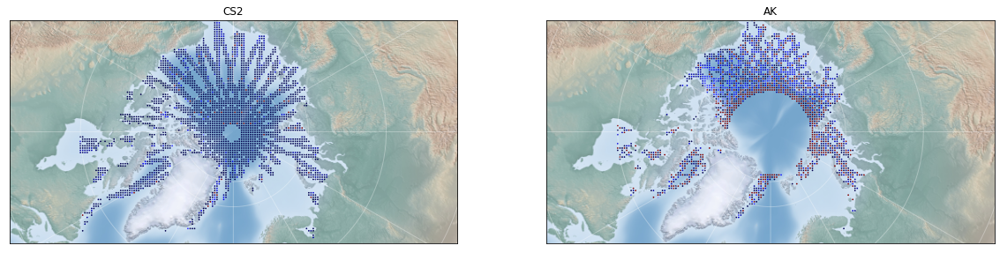

From 20140204 to 20140211:


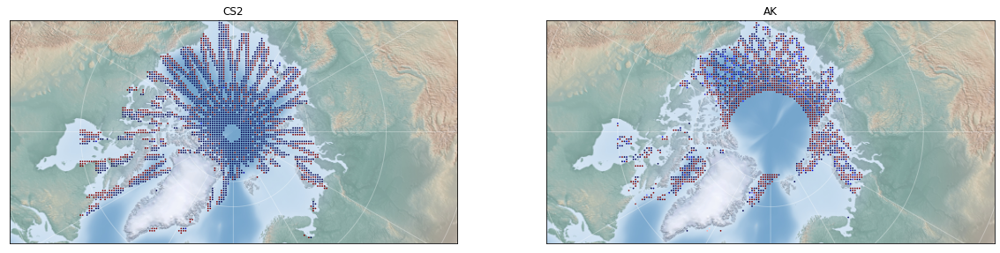

From 20140211 to 20140218:


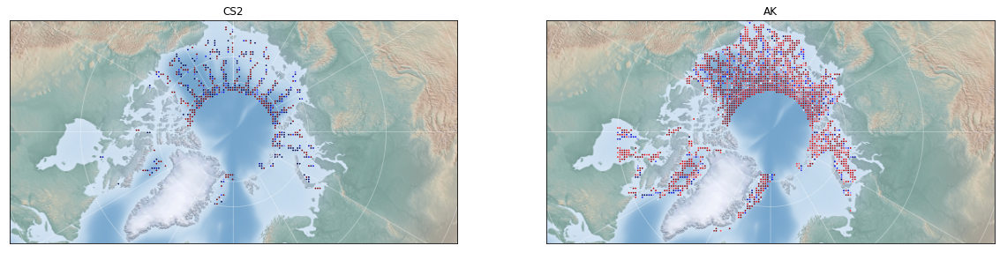

From 20140218 to 20140225:


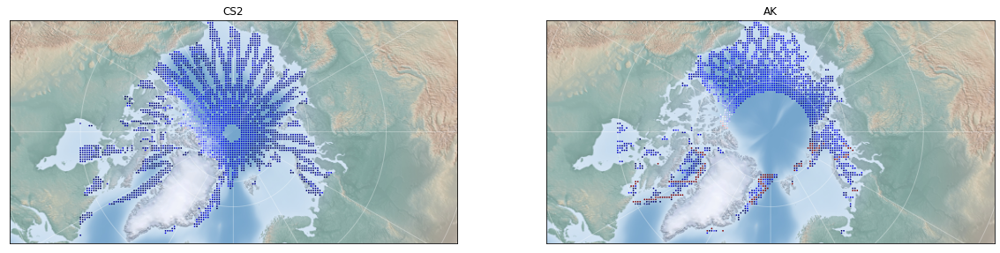

From 20140225 to 20140304:


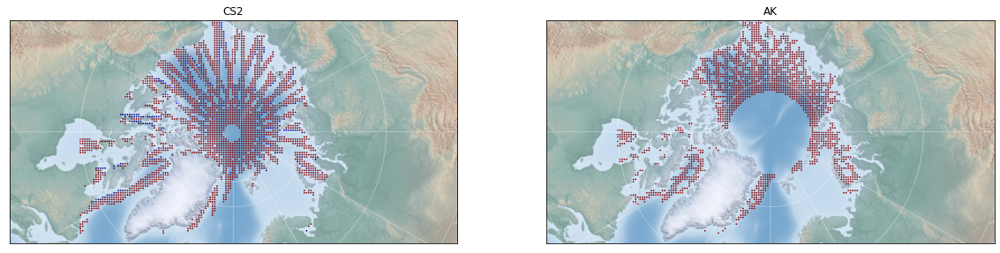

From 20140304 to 20140311:


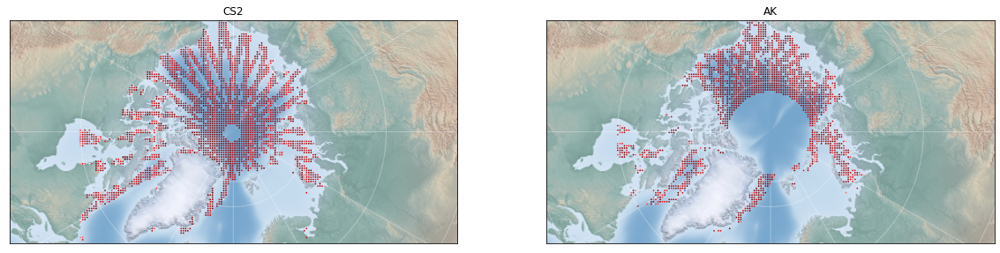

From 20140311 to 20140318:


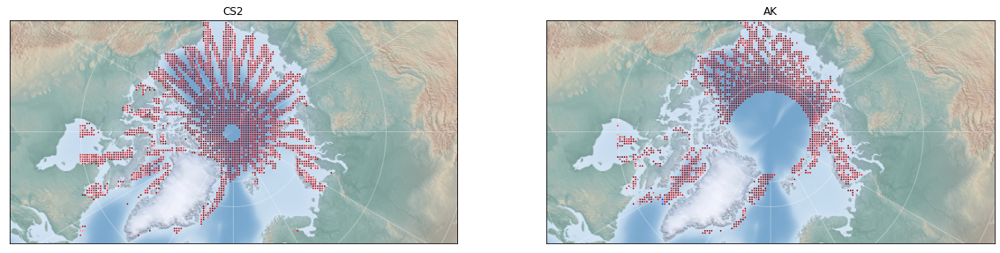

From 20140318 to 20140325:


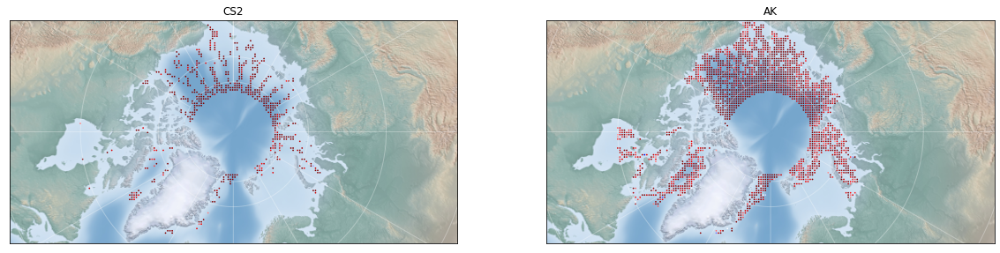

From 20140325 to 20140401:


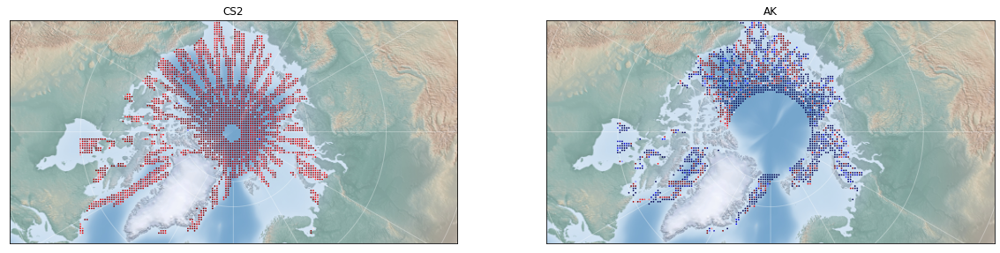

From 20140401 to 20140408:


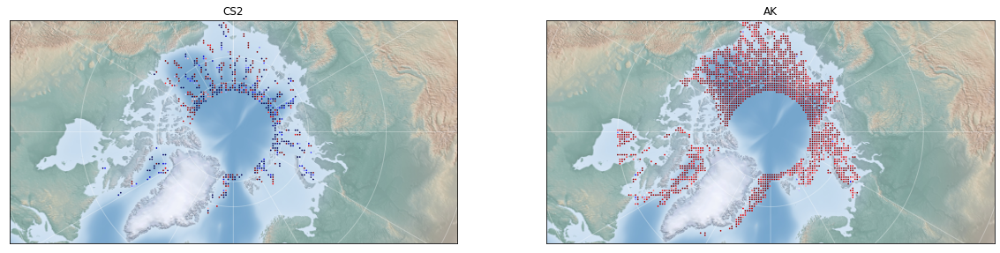

From 20140408 to 20140415:


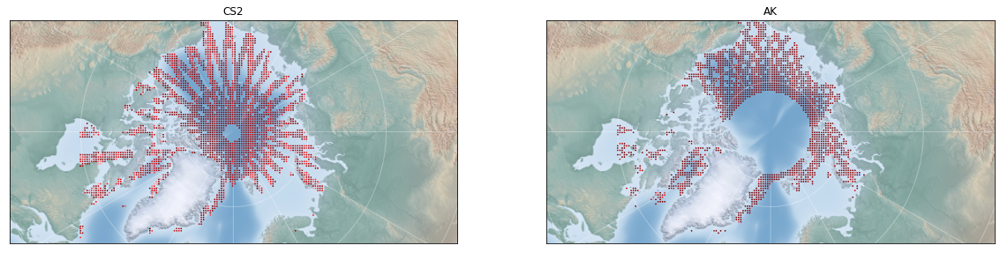

From 20140415 to 20140422:


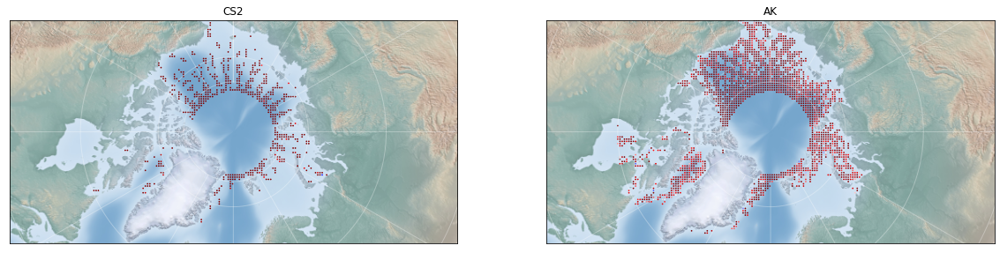

From 20140422 to 20140429:


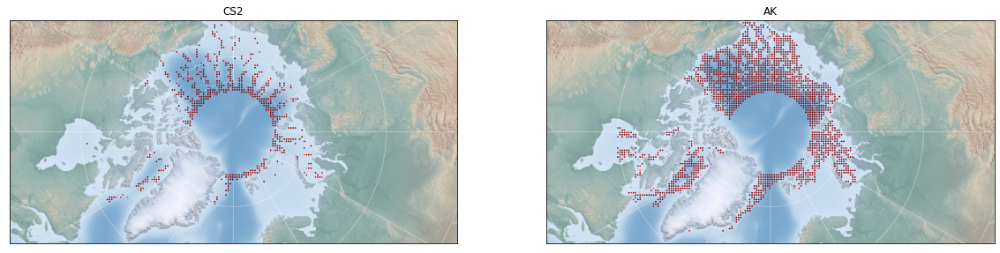

In [10]:
sliding_window = 7
for i in range(len(ak_values)//sliding_window):
    shape = (sliding_window, 160, 160)
    ak_map = np.empty(shape)
    cs2_map = np.empty(shape)

    for j, date in enumerate(list(ak_values.keys())[i*sliding_window:min(i*sliding_window+sliding_window, len(ak_values))]):
        ak_map[j] += ak_values[date]
        cs2_map[j] += cs2_values[date]


    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=RuntimeWarning)
        cs2_mean = np.nanmean(cs2_map, axis=0)
        ak_mean = np.nanmean(ak_map, axis=0)
    
    # 1. Draw map background:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 40))

    # Draw map
    m = Basemap(projection='lcc', resolution=None, lat_0=-90, lon_0=0, lat_1=89.9, lon_1=180, width=1E7, height=0.5E7, ax=ax1)
    draw_map(m)

    # 2. Scatter observation data
    m.scatter(lon_g, lat_g, latlon=True, alpha=1, s=0.5, c=cs2_mean, cmap="seismic", ax=ax1, vmin=0, vmax=1)
    ax1.set_title("CS2")

    # Draw map
    m = Basemap(projection='lcc', resolution=None, lat_0=-90, lon_0=0, lat_1=89.9, lon_1=180, width=1E7, height=0.5E7, ax=ax2)
    draw_map(m)

    # 2. Scatter observation data
    m.scatter(lon_g, lat_g, latlon=True, alpha=1, s=0.5, c=ak_mean, cmap="seismic", ax=ax2, vmin=0, vmax=1)
    ax2.set_title("AK")

    first_date = list(ak_values.keys())[i*sliding_window]
    last_date = list(ak_values.keys())[min(i*sliding_window+sliding_window, len(ak_values)-1)]
    print(f"From {first_date} to {last_date}:")
    plt.show()


In [6]:
grid_x = np.load("../WG_x.npy")
grid_y = np.load("../WG_y.npy")

In [102]:
grid_x

array([[      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.],
       [      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.],
       [      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.],
       ...,
       [      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.],
       [      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.],
       [      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.]])

In [7]:
data_shape = ak_values['20131010'].shape

In [46]:
# Iterate over each avaialable range of dates
# For each element in the columns
ak_observations = []
cs2_observations = []
for i in range(data_shape[0]):
    # For each element in the rows
    for j in range(data_shape[1]):
        # Iterate over each available trenche 
        for date in list(ak_values.keys())[:30]:
            if not np.isnan(ak_values[date][i][j]) and ak_values[date][i][j] > 0:
                ak_observations.append([grid_x[i][j], grid_y[i][j], 1, ak_values[date][i][j], 0.1])
            else:
                ak_observations.append([grid_x[i][j], grid_y[i][j], 1, 0, 0.1])

            if not np.isnan(cs2_values[date][i][j]) and cs2_values[date][i][j] > 0:
                cs2_observations.append([grid_x[i][j], grid_y[i][j], 0, cs2_values[date][i][j], 0.1])
            else:
               cs2_observations.append([grid_x[i][j], grid_y[i][j], 0, 0, 0.1])


In [47]:
cs2_observations.extend(ak_observations)

In [48]:
data = pd.DataFrame(cs2_observations, columns=["Longitude", "Latitude", "Type", "Value", "StdDev"])


<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

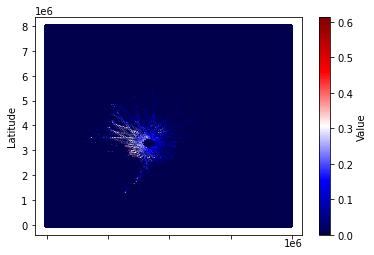

In [49]:
data[data['Type']==0].plot(kind='scatter', x='Longitude', y='Latitude', c='Value', cmap='seismic')

<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

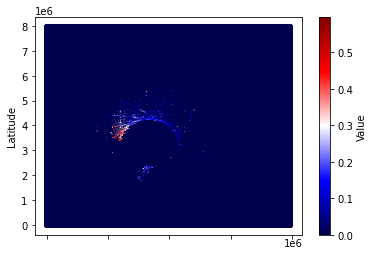

In [50]:
data[data['Type']==1].plot(kind='scatter', x='Longitude', y='Latitude', c='Value', cmap='seismic')

,Longitude,Latitude,Type,Value,StdDev
0,2600000.0,1400000.0,0,0.289507,0.1
1,2600000.0,1450000.0,0,0.212031,0.1
2,2650000.0,1450000.0,0,0.036277,0.1
3,2650000.0,1500000.0,0,0.184012,0.1
4,2650000.0,1550000.0,0,0.115775,0.1
...,...,...,...,...,...
14223,3900000.0,5650000.0,0,0.137967,0.1
14224,3750000.0,5700000.0,0,0.239800,0.1
14225,3800000.0,5700000.0,0,0.015825,0.1
14226,3800000.0,5700000.0,0,0.148300,0.1


In [32]:
x_50km = grid_x
y_50km = grid_y

In [ ]:
fb = data[obs[counter]]
m = Basemap(projection='npstere',boundinglat=60,lon_0=0,resolution='l',round=True)                                
ax1 = m.drawparallels(np.arange(60,90,10),linewidth=0.25, linestyle='solid', zorder=8)
ax1 = m.drawmeridians(np.arange(0.,360.,30.), linewidth=0.25,zorder=8)
ax1 = m.drawcoastlines(linewidth=0.5)
ax1 = m.drawmapboundary(fill_color='0.3')
ax1 = m.fillcontinents(color='0.7',lake_color='0.3')
ax1 = m.pcolormesh(x_50km,y_50km,fb,cmap='YlGnBu_r',vmin=0.0,vmax=0.5)
plt.title(obs[counter])


In [37]:
x = np.load("../will_lons.npy")[:-1][:-1]

In [40]:
x[0]

array([-45.        , -44.57737355, -44.14851314, -43.71332892,
       -43.27173133, -42.82363118, -42.36893982, -41.90756929,
       -41.4394325 , -40.96444339, -40.48251716, -39.99357039,
       -39.49752135, -38.99429016, -38.48379904, -37.96597256,
       -37.44073791, -36.90802515, -36.36776752, -35.81990171,
       -35.26436819, -34.70111151, -34.13008065, -33.55122934,
       -32.96451642, -32.36990621, -31.76736886, -31.15688071,
       -30.53842474, -29.91199086, -29.27757639, -28.63518637,
       -27.98483402, -27.32654106, -26.66033815, -25.98626526,
       -25.30437198, -24.61471795, -23.91737316, -23.21241828,
       -22.49994496, -21.78005611, -21.05286616, -20.31850129,
       -19.57709959, -18.82881123, -18.07379859, -17.3122363 ,
       -16.54431131, -15.77022281, -14.99018224, -14.20441308,
       -13.41315074, -12.61664232, -11.8151463 , -11.0089322 ,
       -10.1982802 ,  -9.38348069,  -8.56483371,  -7.74264846,
        -6.91724261,  -6.08894168,  -5.25807831,  -4.42

In [42]:
max(data['Latitude'])

5700000.0

In [44]:
min(data['Longitude'])

900000.0

In [45]:
grid_x

array([[      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.],
       [      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.],
       [      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.],
       ...,
       [      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.],
       [      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.],
       [      0.,   50000.,  100000., ..., 7850000., 7900000., 7950000.]])